In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

from scipy.stats import zscore
from sklearn.impute import KNNImputer
from scipy.spatial import distance
from scipy.interpolate import interp1d
from scipy import stats
from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis

In [2]:
from pathlib import Path
print(Path.cwd())

from os import walk

# folder path
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 4Final\Desigo\BTU\TABS'

file_list = []
for (dir_path, dir_names, file_names) in walk(dir_path):
    file_list.extend(file_names)
    # don't look inside any subdirectory
    break
print(file_list)

c:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Code Year4
['HZ_BTU1(Total)_energy_060123-053124_raw.csv', 'HZ_BTU1(Total)_flow_060123-053124_raw.csv', 'HZ_BTU1(Total)_ReturnT_060123-053124_raw.csv', 'HZ_BTU1(Total)_SupplyT_060123-053124_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_energy_060123-053124_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_flow_060123-053124_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_ReturnT_060123-053124_raw.csv', 'HZ_BTU10(Z21+22+23+24+25+26+27)_SupplyT_060123-053124_raw.csv', 'HZ_BTU11(Z32+33)_energy_060123-053124_raw.csv', 'HZ_BTU11(Z32+33)_flow_060123-053124_raw.csv', 'HZ_BTU11(Z32+33)_ReturnT_060123-053124_raw.csv', 'HZ_BTU11(Z32+33)_SupplyT_060123-053124_raw.csv', 'HZ_BTU13(Z31)_energy_060123-053124_raw.csv', 'HZ_BTU13(Z31)_flow_060123-053124_raw.csv', 'HZ_BTU13(Z31)_ReturnT_060123-053124_raw.csv', 'HZ_BTU13(Z31)_SupplyT_060123-053124_raw.csv', 'HZ_BTU5(Z2+3+4+5)_energy_060123-053124_raw.csv', 'HZ_BTU5(Z2+3+4+5)_flow_06

In [3]:
import pandas as pd
import os

Lst = []
for file_name in file_list:
    file_path = os.path.join(dir_path, file_name)
    data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col=[0])
    df = pd.DataFrame(data)
    filtered_df = df[df['QualityGood'] == True]
    print(len(filtered_df))
    Lst.append(filtered_df)

527276
527276
527275
527275
527276
527276
527276
527276
527273
527273
527273
527272
527266
527266
527270
527272
527265
527263
527269
527270
527262
527262
527262
527262
527262
527261
527263
527263
527259
527259
527260
527260


In [4]:
Lst_diff = []
Lst_name = []

for i in range(0,len(Lst)):
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    Z = pd.to_numeric(Lst[i][zone_name])
    temp = Z.diff()
    Lst_diff.append(temp.sort_values(ascending=True)[-100:-1].tolist())
    
# print (Lst_diff)

df = pd.DataFrame(Lst_diff).transpose()

df.columns = Lst_name

q_values = df.quantile(0.75)

In [5]:
q_values

BTU1(Total)_energy (kBTU/h)                      29.107533
BTU1(Total)_flow (GPM)                            9.208598
BTU1(Total)_ReturnT (F)                           1.800850
BTU1(Total)_SupplyT (F)                           7.036015
BTU10(Z21+22+23+24+25+26+27)_energy (kBTU/h)     16.966576
BTU10(Z21+22+23+24+25+26+27)_flow (GPM)           3.507635
BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)          2.788490
BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)         11.737782
BTU11(Z32+33)_energy (kBTU/h)                     9.059323
BTU11(Z32+33)_flow (GPM)                          1.593743
BTU11(Z32+33)_ReturnT (F)                         2.901344
BTU11(Z32+33)_SupplyT (F)                        11.360432
BTU13(Z31)_energy (kBTU/h)                        1.895972
BTU13(Z31)_flow (GPM)                             0.708019
BTU13(Z31)_ReturnT (F)                            0.744579
BTU13(Z31)_SupplyT (F)                            7.467171
BTU5(Z2+3+4+5)_energy (kBTU/h)                    6.4345

In [6]:
Lst_Slab = []
Lst_name = []
Zone_DF = pd.DataFrame()
res = 1

for i in range(0,len(Lst)):
    
    Lst[i].index = pd.to_datetime(Lst[i].index, errors='coerce', utc=True, format='mixed')
    Lst[i].index = Lst[i].index.tz_convert('US/Eastern')
    
    Lst[i] = Lst[i].resample("1T").mean().ffill()
    
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    Z = pd.to_numeric(Lst[i][zone_name])
    Lst_Slab.append(Z.tolist())
    
    Zone_DF[zone_name] = pd.Series(Z, index=Lst[i].index)
    
Zone_DF

C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\2557909729.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version,

,BTU1(Total)_energy (kBTU/h),BTU1(Total)_flow (GPM),BTU1(Total)_ReturnT (F),BTU1(Total)_SupplyT (F),BTU10(Z21+22+23+24+25+26+27)_energy (kBTU/h),BTU10(Z21+22+23+24+25+26+27)_flow (GPM),BTU10(Z21+22+23+24+25+26+27)_ReturnT (F),BTU10(Z21+22+23+24+25+26+27)_SupplyT (F),BTU11(Z32+33)_energy (kBTU/h),BTU11(Z32+33)_flow (GPM),...,BTU6(Z1)_ReturnT (F),BTU6(Z1)_SupplyT (F),BTU7(Z14+15+16+17)_energy (kBTU/h),BTU7(Z14+15+16+17)_flow (GPM),BTU7(Z14+15+16+17)_ReturnT (F),BTU7(Z14+15+16+17)_SupplyT (F),BTU8(Z11+12+13)_energy (kBTU/h),BTU8(Z11+12+13)_flow (GPM),BTU8(Z11+12+13)_ReturnT (F),BTU8(Z11+12+13)_SupplyT (F)
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-06-01 00:00:00-04:00,0.0,0.0,80.524574,80.994202,0.0,0.0,73.066093,72.959579,0.0,0.0,...,73.019043,72.410896,0.0,0.0,72.230591,73.069160,0.0,0.0,73.314270,72.665886
2023-06-01 00:01:00-04:00,0.0,0.0,80.533333,80.989708,0.0,0.0,73.053268,72.942955,0.0,0.0,...,73.008400,72.404251,0.0,0.0,72.234970,73.055939,0.0,0.0,73.298096,72.638710
2023-06-01 00:02:00-04:00,0.0,0.0,80.553627,81.000061,0.0,0.0,73.074280,72.945351,0.0,0.0,...,73.008629,72.401138,0.0,0.0,72.248108,73.080162,0.0,0.0,73.306190,72.642891
2023-06-01 00:03:00-04:00,0.0,0.0,80.558685,80.991432,0.0,0.0,73.059509,72.953606,0.0,0.0,...,73.012978,72.407242,0.0,0.0,72.242256,73.071098,0.0,0.0,73.307930,72.642761
2023-06-01 00:04:00-04:00,0.0,0.0,80.521721,80.971428,0.0,0.0,73.073936,72.941429,0.0,0.0,...,73.006599,72.393425,0.0,0.0,72.244659,73.089752,0.0,0.0,73.296387,72.641678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-31 23:55:00-04:00,0.0,0.0,81.149307,82.315178,0.0,0.0,70.340012,70.033058,0.0,0.0,...,69.814842,69.256310,0.0,0.0,69.264961,70.096428,0.0,0.0,70.130066,67.449760
2024-05-31 23:56:00-04:00,0.0,0.0,81.145683,82.313560,0.0,0.0,70.331329,70.037430,0.0,0.0,...,69.802086,69.243347,0.0,0.0,69.260368,70.072601,0.0,0.0,70.092590,67.410477
2024-05-31 23:57:00-04:00,0.0,0.0,81.124832,82.301849,0.0,0.0,70.333580,70.035423,0.0,0.0,...,69.795425,69.220573,0.0,0.0,69.243271,70.067833,0.0,0.0,70.124931,67.432671


In [7]:
Zone_DF.columns.values

array(['BTU1(Total)_energy (kBTU/h)', 'BTU1(Total)_flow (GPM)',
       'BTU1(Total)_ReturnT (F)', 'BTU1(Total)_SupplyT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_energy (kBTU/h)',
       'BTU10(Z21+22+23+24+25+26+27)_flow (GPM)',
       'BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
       'BTU11(Z32+33)_energy (kBTU/h)', 'BTU11(Z32+33)_flow (GPM)',
       'BTU11(Z32+33)_ReturnT (F)', 'BTU11(Z32+33)_SupplyT (F)',
       'BTU13(Z31)_energy (kBTU/h)', 'BTU13(Z31)_flow (GPM)',
       'BTU13(Z31)_ReturnT (F)', 'BTU13(Z31)_SupplyT (F)',
       'BTU5(Z2+3+4+5)_energy (kBTU/h)', 'BTU5(Z2+3+4+5)_flow (GPM)',
       'BTU5(Z2+3+4+5)_ReturnT (F)', 'BTU5(Z2+3+4+5)_SupplyT (F)',
       'BTU6(Z1)_energy (kBTU/h)', 'BTU6(Z1)_flow (GPM)',
       'BTU6(Z1)_ReturnT (F)', 'BTU6(Z1)_SupplyT (F)',
       'BTU7(Z14+15+16+17)_energy (kBTU/h)',
       'BTU7(Z14+15+16+17)_flow (GPM)', 'BTU7(Z14+15+16+17)_ReturnT (F)',
       'BTU7(Z14+15+16+17)_SupplyT (F)',
    

<Axes: xlabel='Timestamp'>

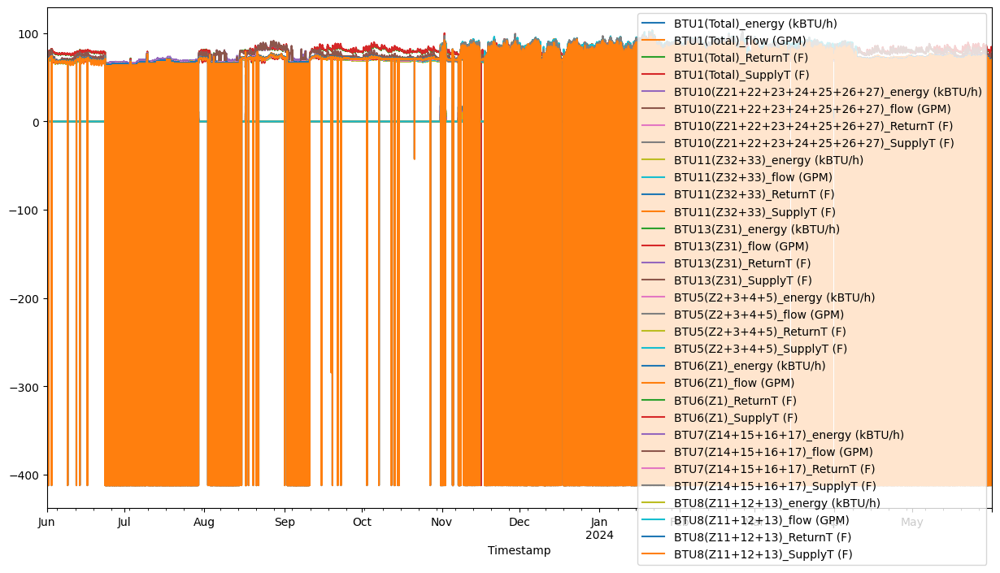

In [8]:
Zone_DF.plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

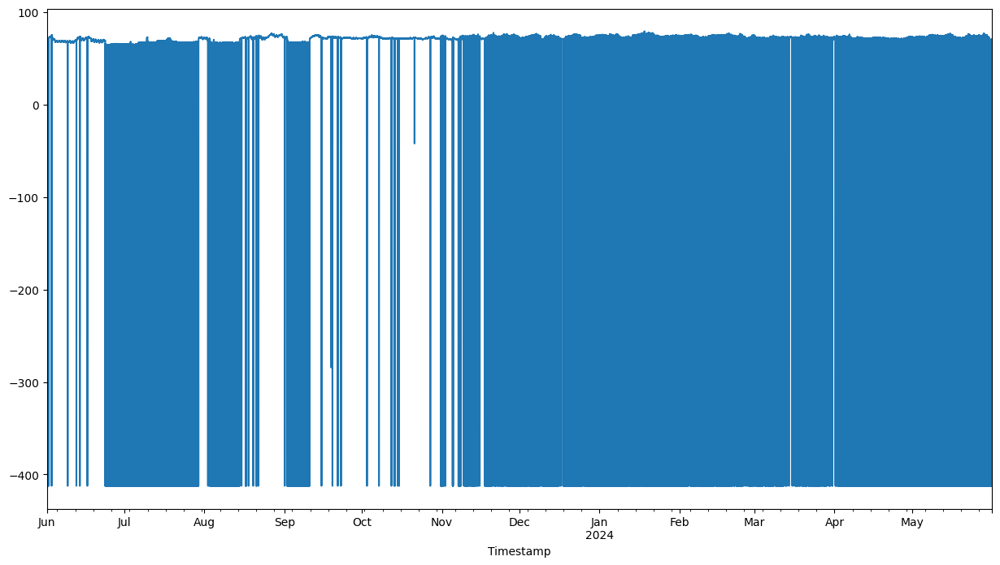

In [9]:
Zone_DF["BTU8(Z11+12+13)_ReturnT (F)"].plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

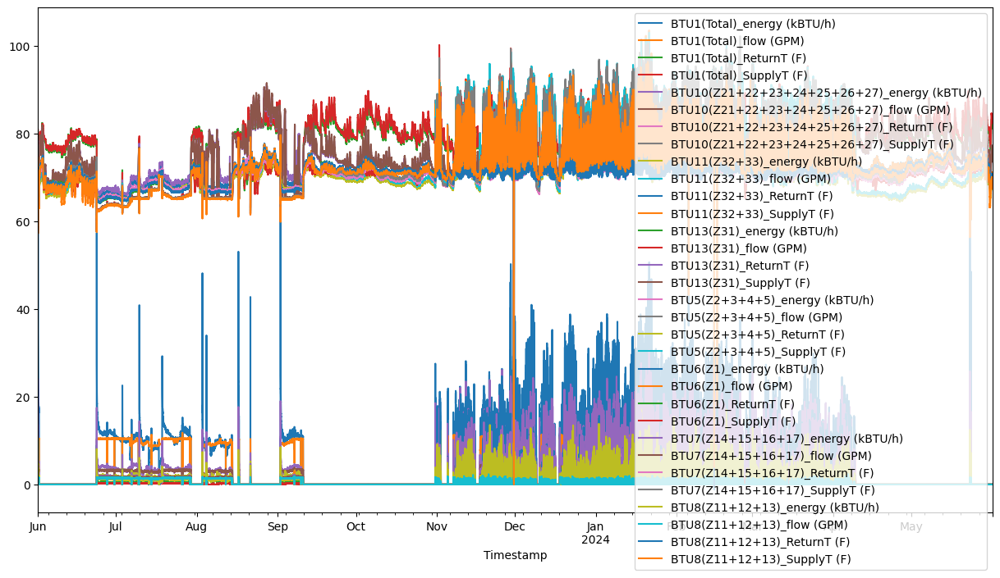

In [10]:
Zone_DF[Zone_DF < -10] = np.nan
Zone_DF.plot(figsize=(15, 8))

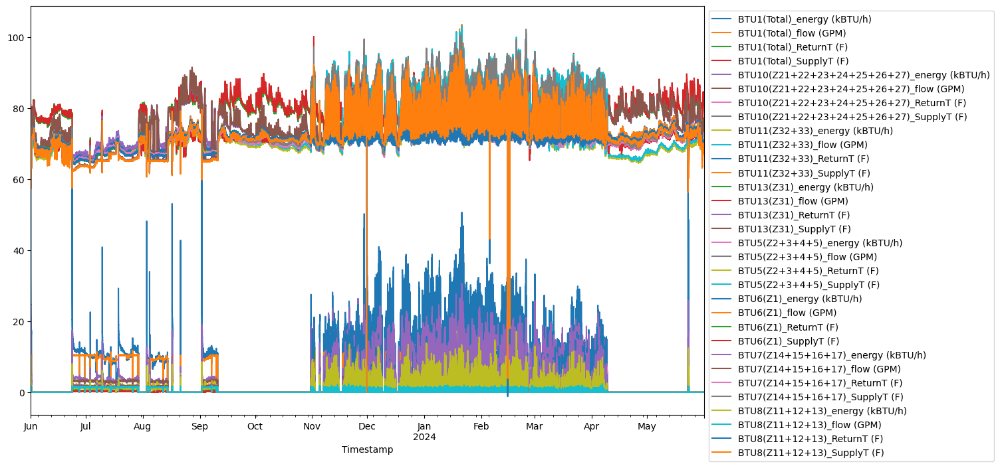

In [11]:
# Place a legend outside the plot
Zone_DF.plot(figsize=(15, 8))
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adjust the subplot parameters to give the plot more room for the legend
plt.subplots_adjust(right=0.8)

In [12]:
df = Zone_DF

In [13]:
# Filter columns containing "(F)"
columns_with_F = [col for col in Zone_DF.columns if "(F)" in col]
# Filter columns not containing "(F)"
columns_without_F = [col for col in Zone_DF.columns if "(F)" not in col]

# Create two DataFrames based on the filter
df_with_F = Zone_DF[columns_with_F]
df_without_F = Zone_DF[columns_without_F]

In [14]:
columns_with_F

['BTU1(Total)_ReturnT (F)',
 'BTU1(Total)_SupplyT (F)',
 'BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
 'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
 'BTU11(Z32+33)_ReturnT (F)',
 'BTU11(Z32+33)_SupplyT (F)',
 'BTU13(Z31)_ReturnT (F)',
 'BTU13(Z31)_SupplyT (F)',
 'BTU5(Z2+3+4+5)_ReturnT (F)',
 'BTU5(Z2+3+4+5)_SupplyT (F)',
 'BTU6(Z1)_ReturnT (F)',
 'BTU6(Z1)_SupplyT (F)',
 'BTU7(Z14+15+16+17)_ReturnT (F)',
 'BTU7(Z14+15+16+17)_SupplyT (F)',
 'BTU8(Z11+12+13)_ReturnT (F)',
 'BTU8(Z11+12+13)_SupplyT (F)']

In [15]:
# Update 'Lst_name' to contain the names of columns that include "(F)".
Lst_name = columns_with_F

In [16]:
# Checking the type of the element in the q_values of 'Lst_name' (This should show a numpy float!)
type(q_values[Lst_name][0])

C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\2880792931.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  type(q_values[Lst_name][0])


numpy.float64

In [17]:
for i in range(0,len(Lst_name)):
    df = df_with_F[Lst_name[i]]
#     print (abs(df.diff())> q_values[Lst_name][i])
#     df_with_F[Lst_name[i]] = df.drop(df[abs(df.diff())> q_values[Lst_name][i]].index)

#If the absolute difference between consecutive values is greater than 5, drop them.
    df_with_F[Lst_name[i]] = df.drop(df[abs(df.diff())> 5].index)

C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\2857651773.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_with_F[Lst_name[i]] = df.drop(df[abs(df.diff())> 5].index)


<Axes: xlabel='Timestamp'>

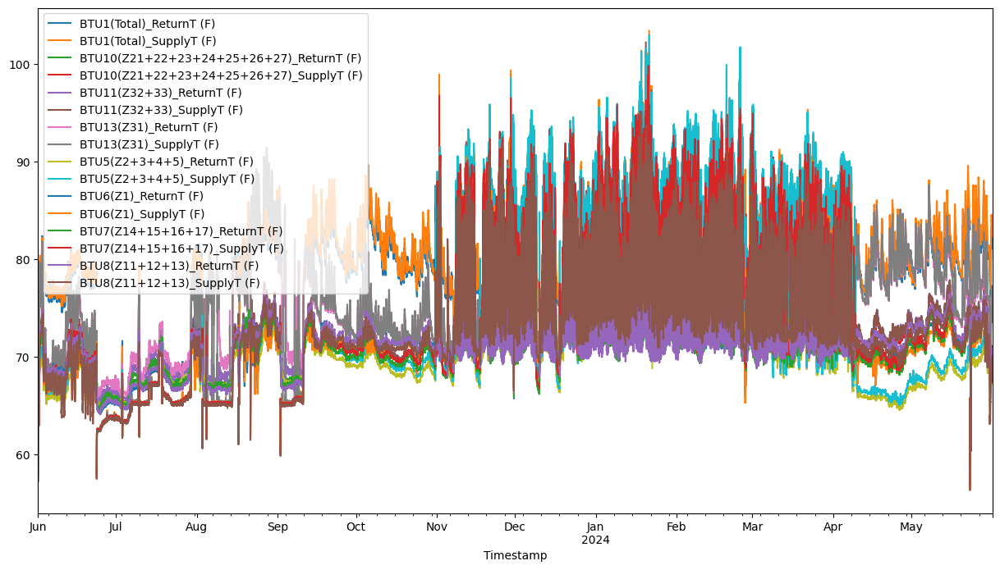

In [18]:
df_with_F.plot(figsize=(15, 8))

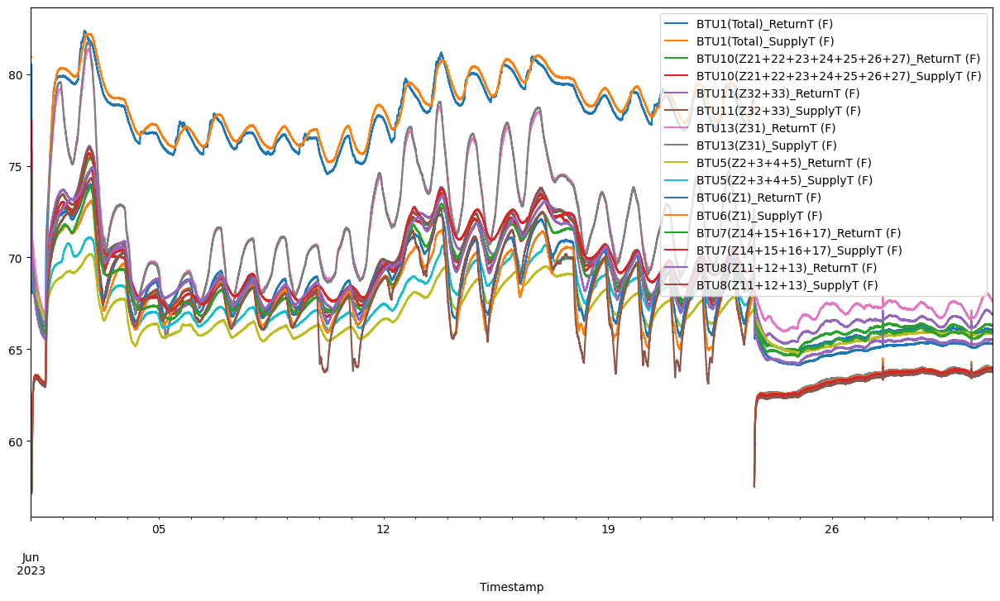

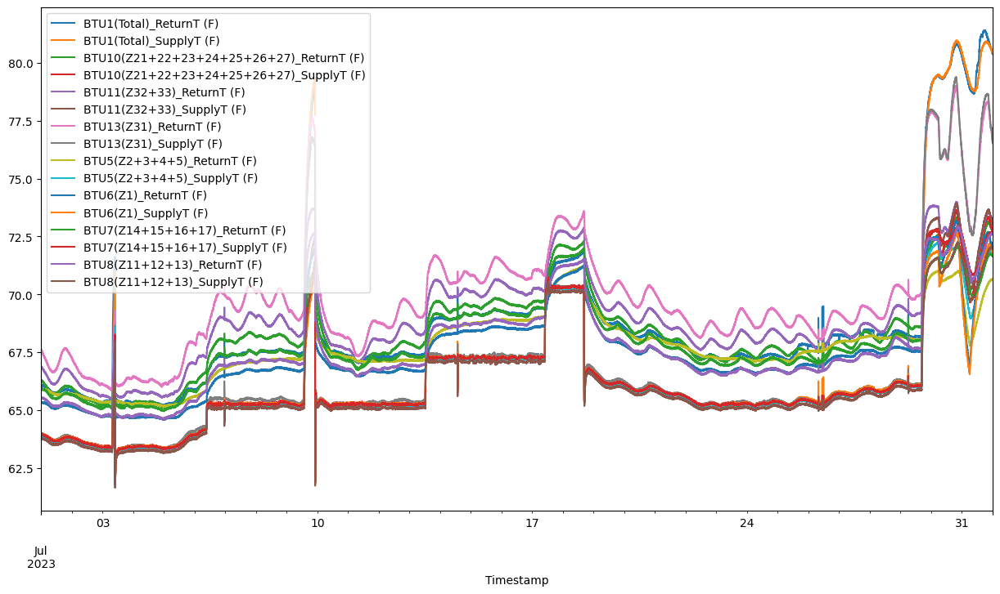

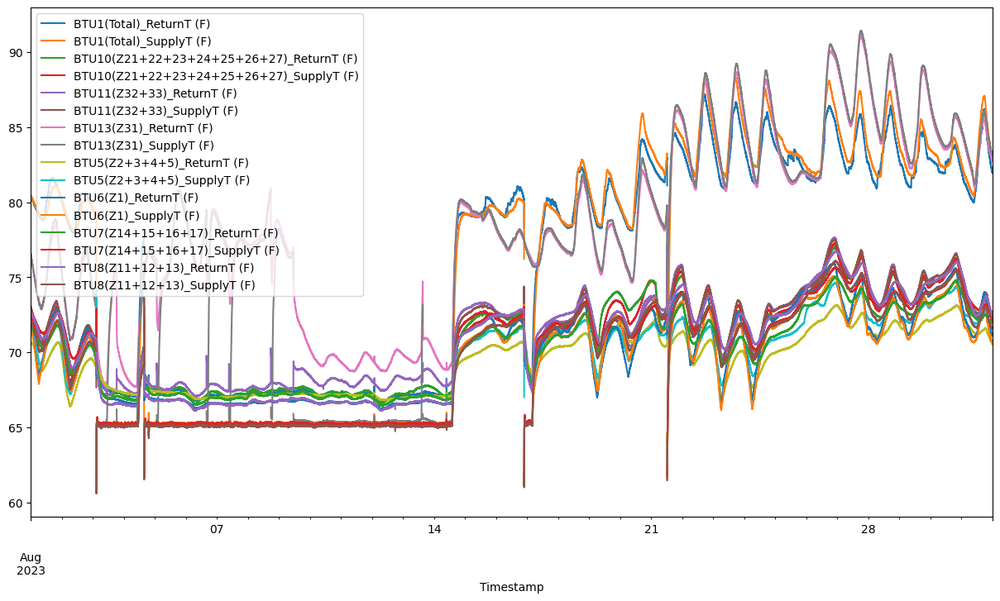

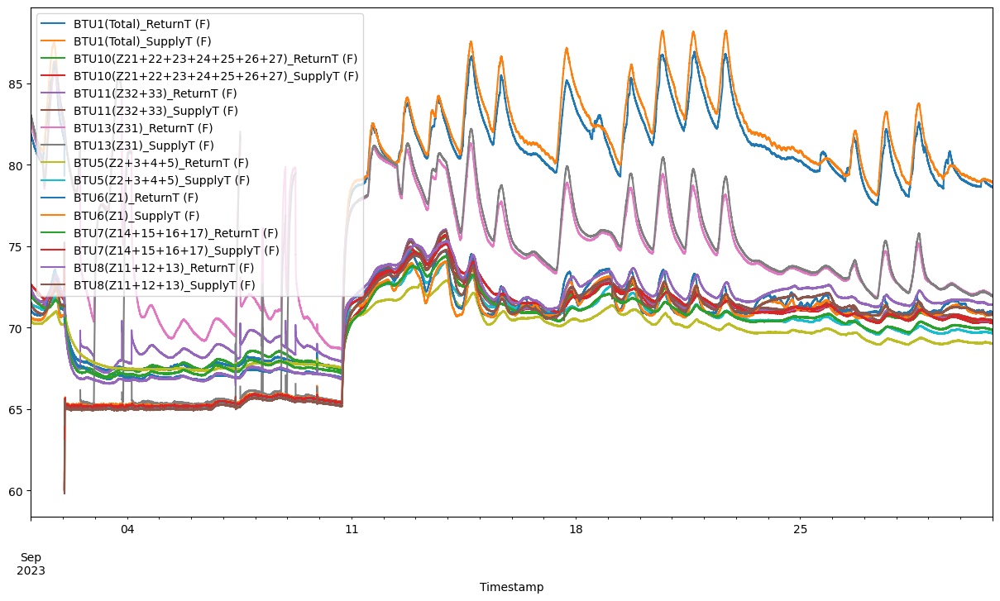

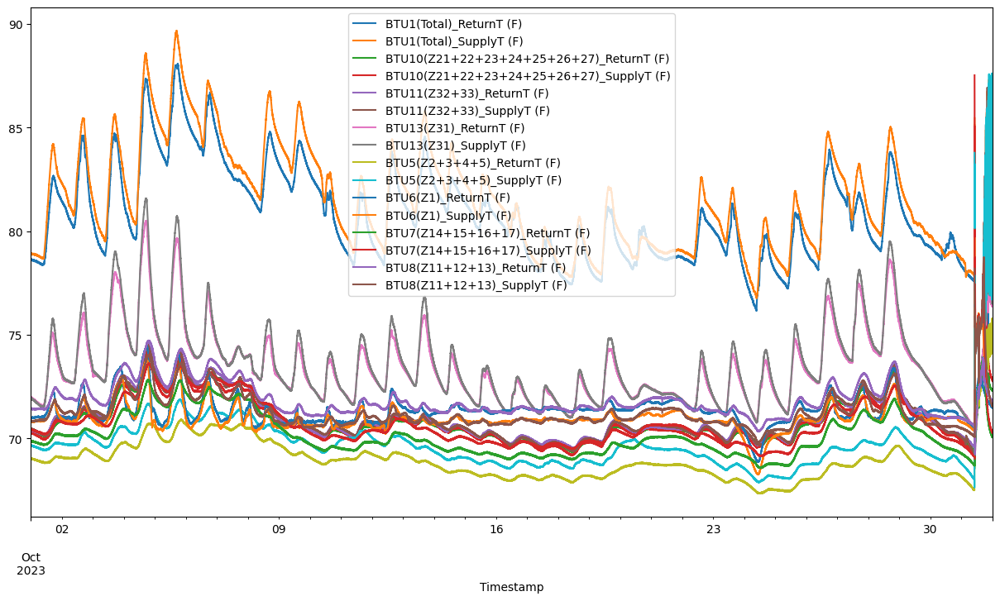

...

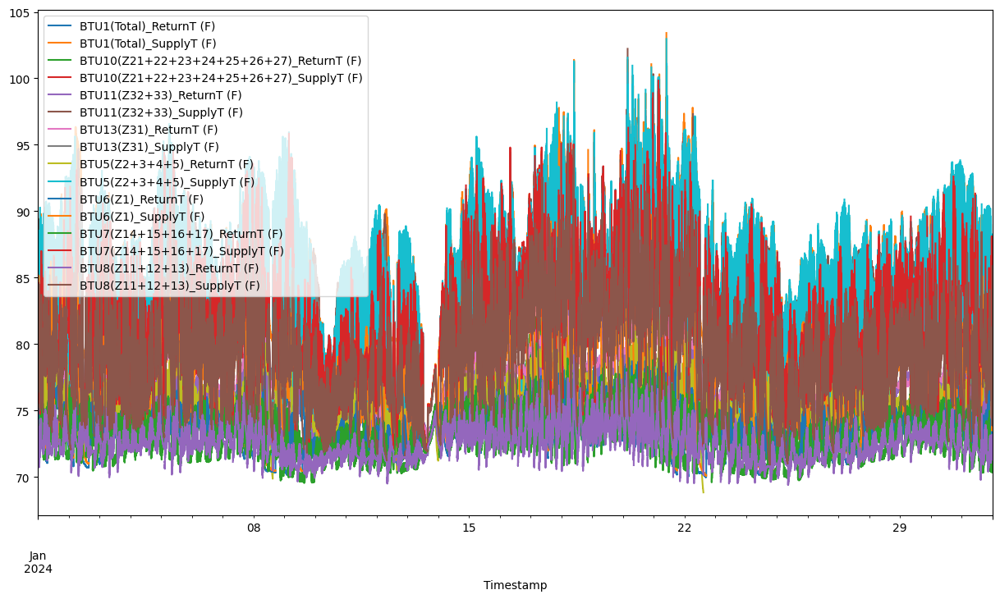

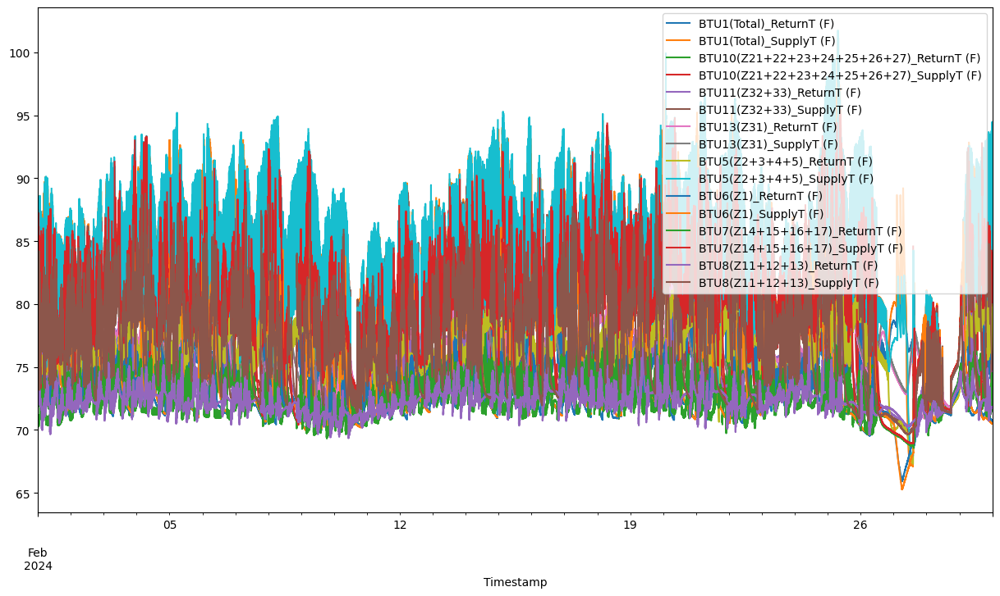

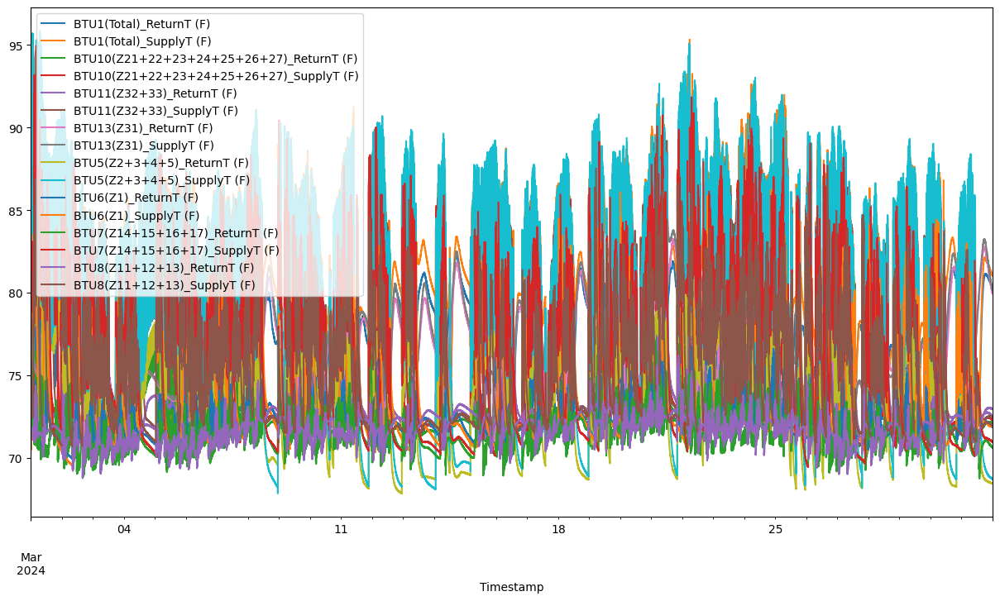

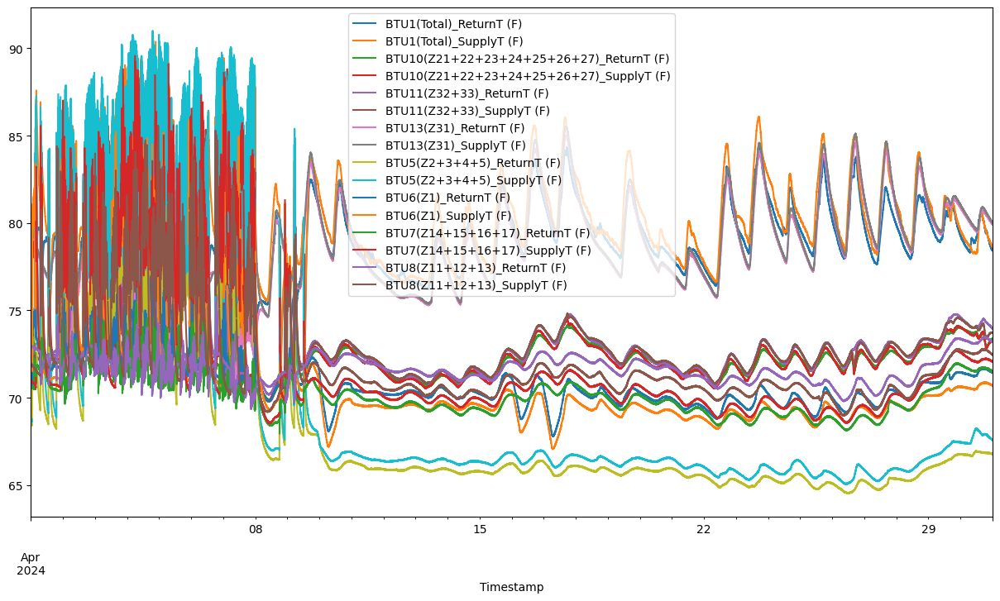

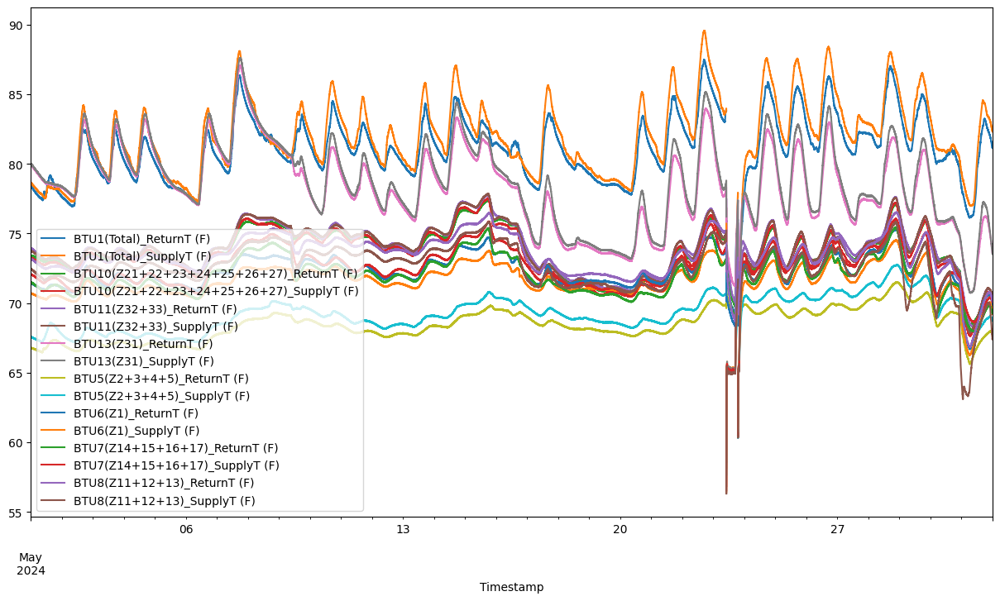

In [19]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in df_with_F.groupby([df_with_F.index.year, df_with_F.index.month]):

    group.plot(figsize=(15, 8))
    

In [20]:
def mahalanobis_distance(x, data):
    """Calculate the Mahalanobis distance for each observation in x from the distribution of data"""
    x_minus_mu = x - np.mean(data)
    cov = np.cov(data.values.T)
    inv_covmat = np.linalg.inv(cov)
    left_term = np.dot(x_minus_mu, inv_covmat)
    mahal = np.dot(left_term, x_minus_mu.T)
    return mahal.diagonal()

def remove_outliers(df, columns):
    # Assuming df has a datetime index, group by year and month
    groups = df.groupby([df.index.year, df.index.month])
    
    # Process each group
    for (year, month), group in groups:
        feature_set = group[columns]
        
        # Skip groups with less data points than columns to avoid singular matrix error
        if feature_set.shape[0] <= feature_set.shape[1]:
            continue
        
        # Compute the Mahalanobis distance for each observation
        group['mahalanobis'] = mahalanobis_distance(x=feature_set, data=feature_set)
        # Calculate the p-value for each Mahalanobis distance
        group['p_value'] = 1 - chi2.cdf(group['mahalanobis'], df=feature_set.shape[1])
        
        # Choose a significance level
        significance_level = 0.005
        # Identify outliers
        outliers = group['p_value'] < significance_level
        # Set outliers to NaN
        df.loc[group[outliers].index, columns] = np.nan
    
    # Drop columns for Mahalanobis distance and p-value if they exist
    df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)
    
    return df

# Define subsets for each zone
Zone_Temp_base = ['BTU1(Total)_ReturnT (F)', 'BTU1(Total)_SupplyT (F)','BTU5(Z2+3+4+5)_ReturnT (F)', 'BTU5(Z2+3+4+5)_SupplyT (F)',
       'BTU6(Z1)_ReturnT (F)', 'BTU6(Z1)_SupplyT (F)',
       'BTU7(Z14+15+16+17)_ReturnT (F)', 'BTU7(Z14+15+16+17)_SupplyT (F)', 'BTU8(Z11+12+13)_ReturnT (F)', 'BTU8(Z11+12+13)_SupplyT (F)']
Zone_Temp_fir = ['BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
       'BTU11(Z32+33)_ReturnT (F)', 'BTU11(Z32+33)_SupplyT (F)',
       'BTU13(Z31)_ReturnT (F)', 'BTU13(Z31)_SupplyT (F)']


In [21]:
df_with_F.columns.values

array(['BTU1(Total)_ReturnT (F)', 'BTU1(Total)_SupplyT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)',
       'BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)',
       'BTU11(Z32+33)_ReturnT (F)', 'BTU11(Z32+33)_SupplyT (F)',
       'BTU13(Z31)_ReturnT (F)', 'BTU13(Z31)_SupplyT (F)',
       'BTU5(Z2+3+4+5)_ReturnT (F)', 'BTU5(Z2+3+4+5)_SupplyT (F)',
       'BTU6(Z1)_ReturnT (F)', 'BTU6(Z1)_SupplyT (F)',
       'BTU7(Z14+15+16+17)_ReturnT (F)', 'BTU7(Z14+15+16+17)_SupplyT (F)',
       'BTU8(Z11+12+13)_ReturnT (F)', 'BTU8(Z11+12+13)_SupplyT (F)'],
      dtype=object)

<Axes: xlabel='Timestamp'>

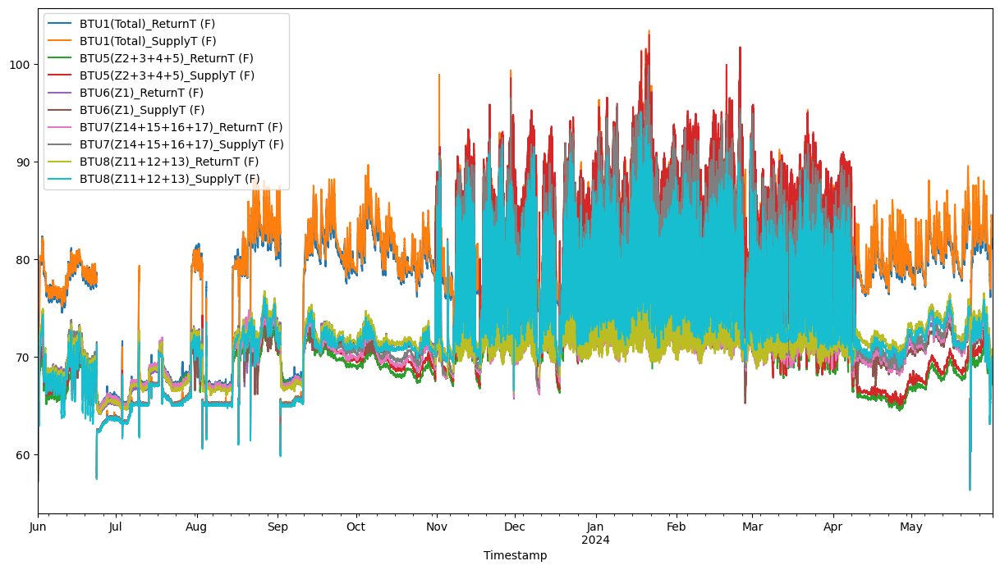

In [22]:
df_with_F[Zone_Temp_base].plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

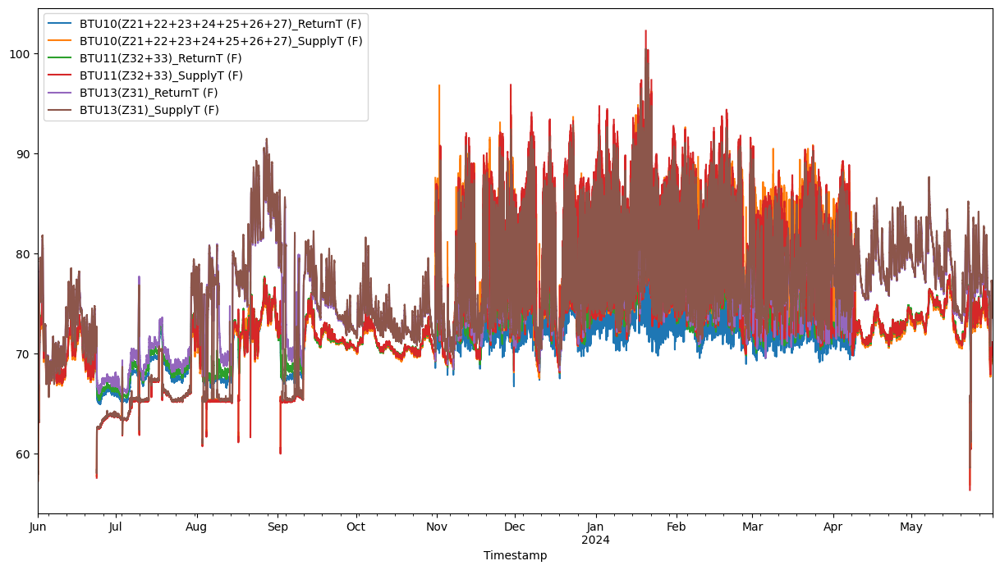

In [23]:
df_with_F[Zone_Temp_fir].plot(figsize=(15, 8))

In [24]:
print(df_with_F.index.min(), df_with_F.index.max())

2023-06-01 00:00:00-04:00 2024-05-31 23:59:00-04:00


<Axes: xlabel='Timestamp'>

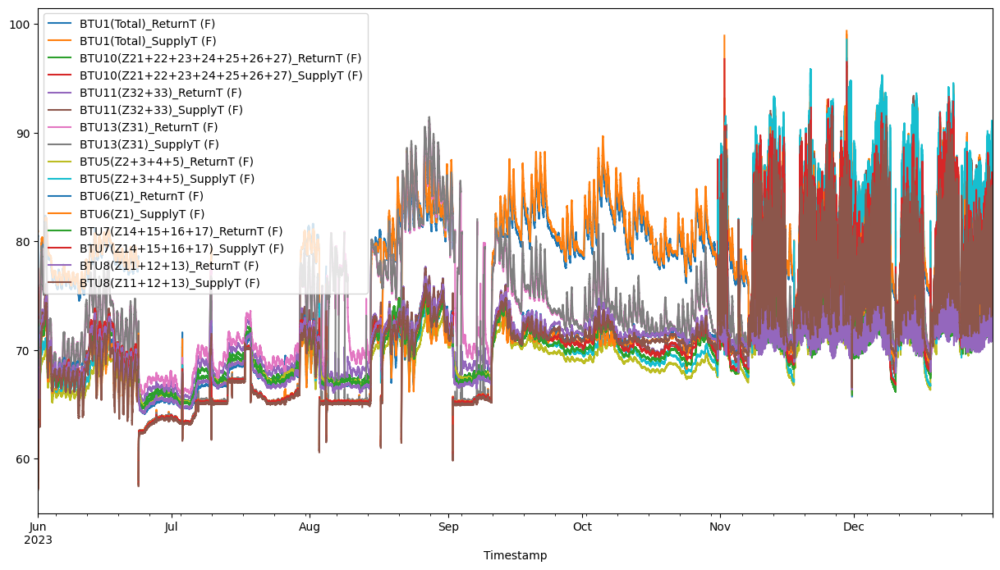

In [25]:
df_with_F1 = df_with_F[: "2023-12-31"]

df_with_F1.plot(figsize=(15, 8))

In [26]:
df_with_F1.isna().sum()

BTU1(Total)_ReturnT (F)                       23
BTU1(Total)_SupplyT (F)                     1071
BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)       3
BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)    1680
BTU11(Z32+33)_ReturnT (F)                      3
BTU11(Z32+33)_SupplyT (F)                   1633
BTU13(Z31)_ReturnT (F)                         5
BTU13(Z31)_SupplyT (F)                       539
BTU5(Z2+3+4+5)_ReturnT (F)                     5
BTU5(Z2+3+4+5)_SupplyT (F)                  1392
BTU6(Z1)_ReturnT (F)                           5
BTU6(Z1)_SupplyT (F)                         708
BTU7(Z14+15+16+17)_ReturnT (F)                 3
BTU7(Z14+15+16+17)_SupplyT (F)              2089
BTU8(Z11+12+13)_ReturnT (F)                 3203
BTU8(Z11+12+13)_SupplyT (F)                 4126
dtype: int64

C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)
C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)


<Axes: xlabel='Timestamp'>

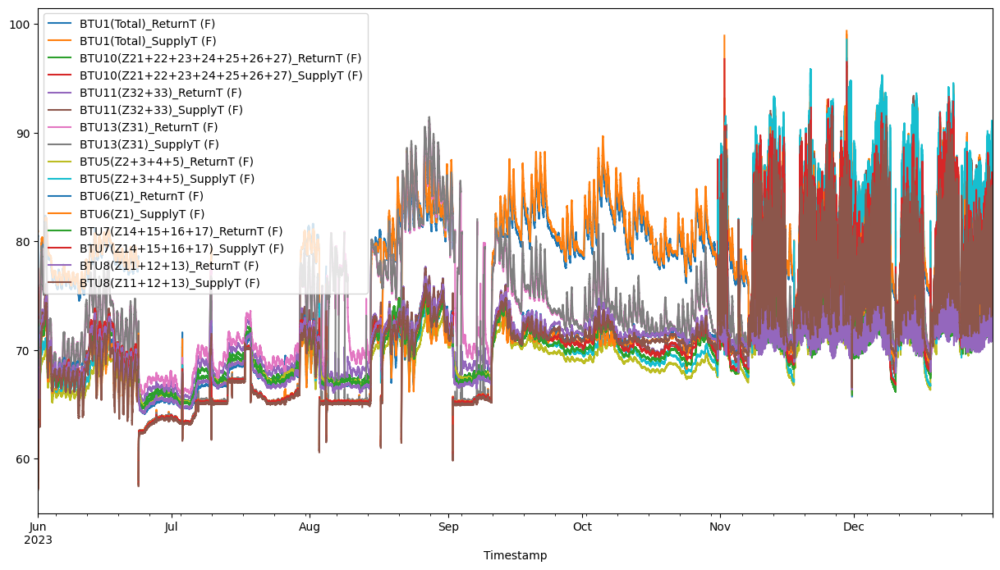

In [27]:
df_with_F1 = remove_outliers(df_with_F1, Zone_Temp_base)
df_with_F1 = remove_outliers(df_with_F1, Zone_Temp_fir)

df_with_F1.plot(figsize=(15, 8))

In [28]:
df_with_F1.isna().sum()

BTU1(Total)_ReturnT (F)                       23
BTU1(Total)_SupplyT (F)                     1071
BTU10(Z21+22+23+24+25+26+27)_ReturnT (F)       3
BTU10(Z21+22+23+24+25+26+27)_SupplyT (F)    1680
BTU11(Z32+33)_ReturnT (F)                      3
BTU11(Z32+33)_SupplyT (F)                   1633
BTU13(Z31)_ReturnT (F)                         5
BTU13(Z31)_SupplyT (F)                       539
BTU5(Z2+3+4+5)_ReturnT (F)                     5
BTU5(Z2+3+4+5)_SupplyT (F)                  1392
BTU6(Z1)_ReturnT (F)                           5
BTU6(Z1)_SupplyT (F)                         708
BTU7(Z14+15+16+17)_ReturnT (F)                 3
BTU7(Z14+15+16+17)_SupplyT (F)              2089
BTU8(Z11+12+13)_ReturnT (F)                 3203
BTU8(Z11+12+13)_SupplyT (F)                 4126
dtype: int64

<Axes: xlabel='Timestamp'>

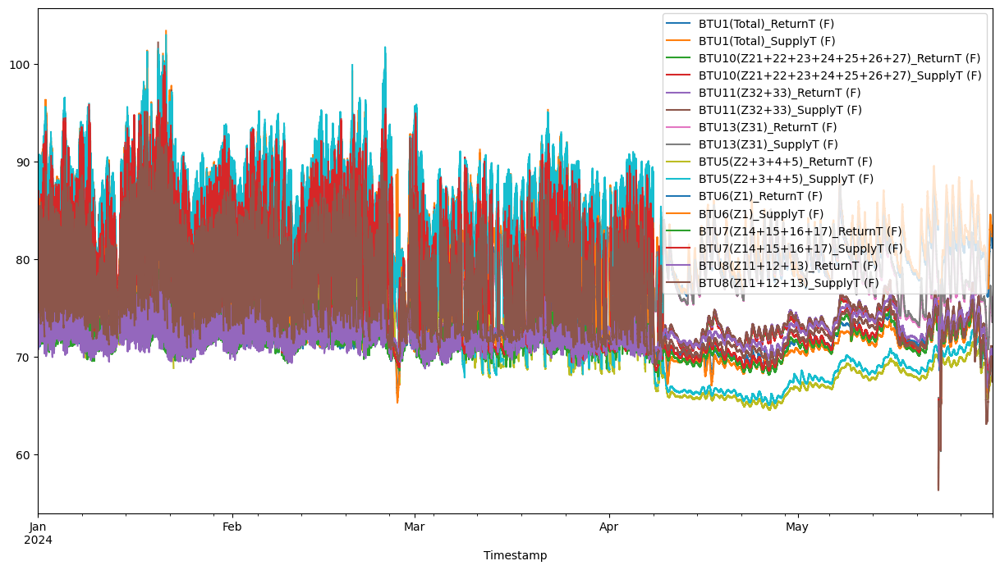

In [29]:
df_with_F2 = df_with_F["2024-01-01":]

df_with_F2.plot(figsize=(15, 8))

C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)
C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\338759660.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['mahalanobis', 'p_value'], errors='ignore', inplace=True)


<Axes: xlabel='Timestamp'>

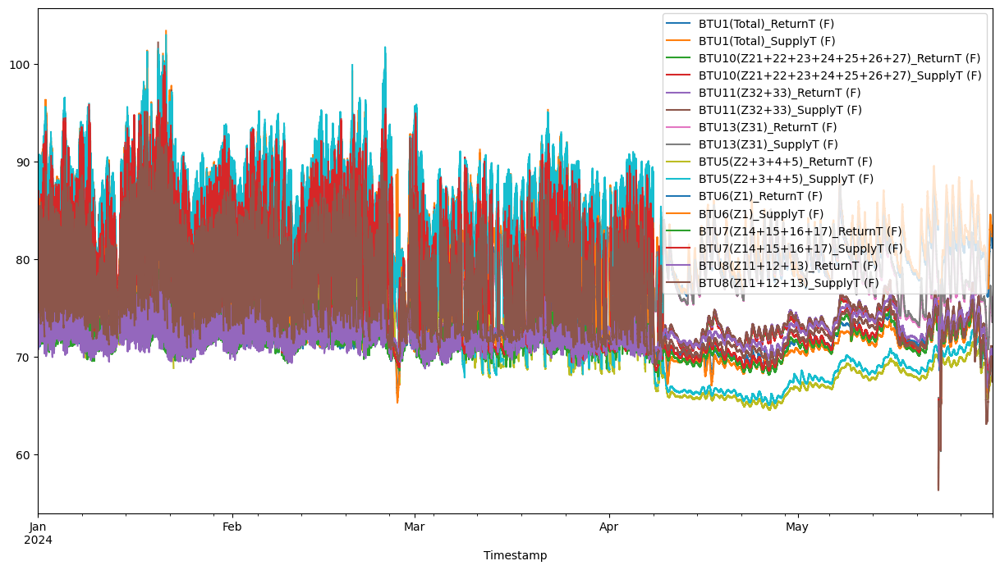

In [30]:
df_with_F2 = remove_outliers(df_with_F2, Zone_Temp_base)
df_with_F2 = remove_outliers(df_with_F2, Zone_Temp_fir)

df_with_F2.plot(figsize=(15, 8))

In [31]:
# Combine all dataframes
combined_df = pd.concat([df_with_F1, df_with_F2])

In [32]:
# Convert Fahrenheit to Celsius
combined_df = (combined_df - 32) * 5/9
# Renaming columns: Replace 'F' with 'C'
combined_df.columns = [col.replace('F', 'C') for col in combined_df.columns]

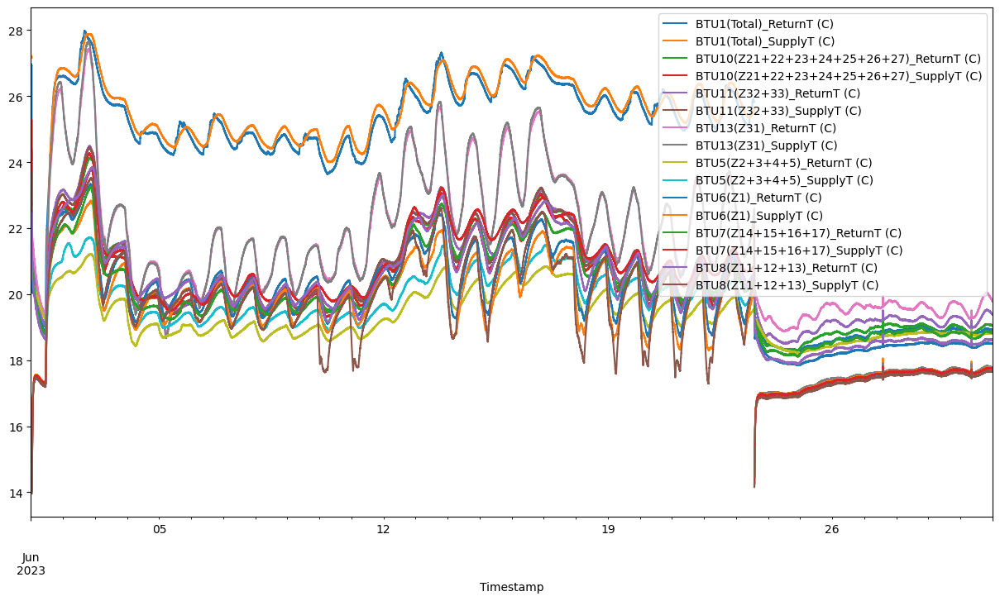

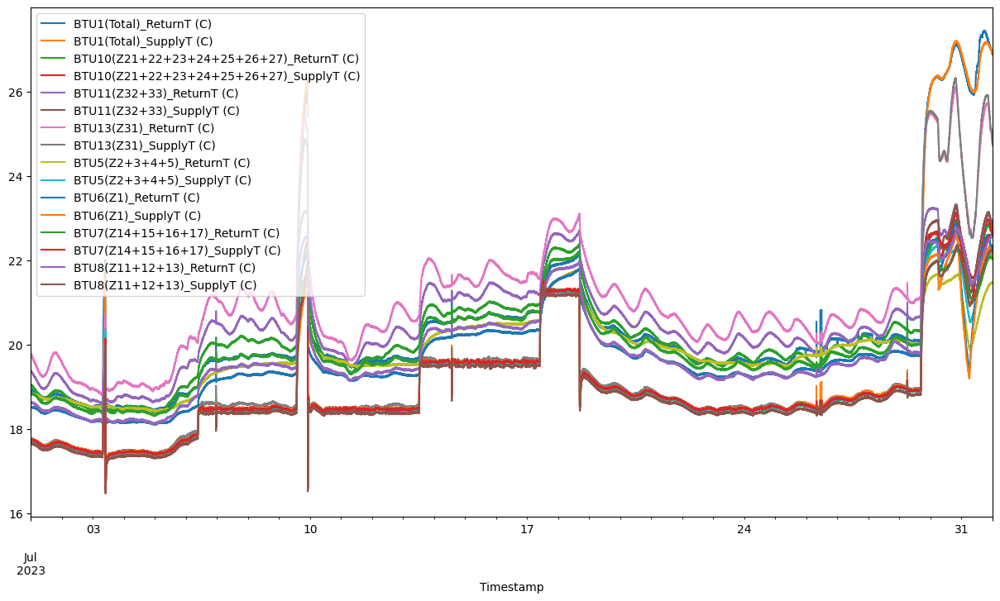

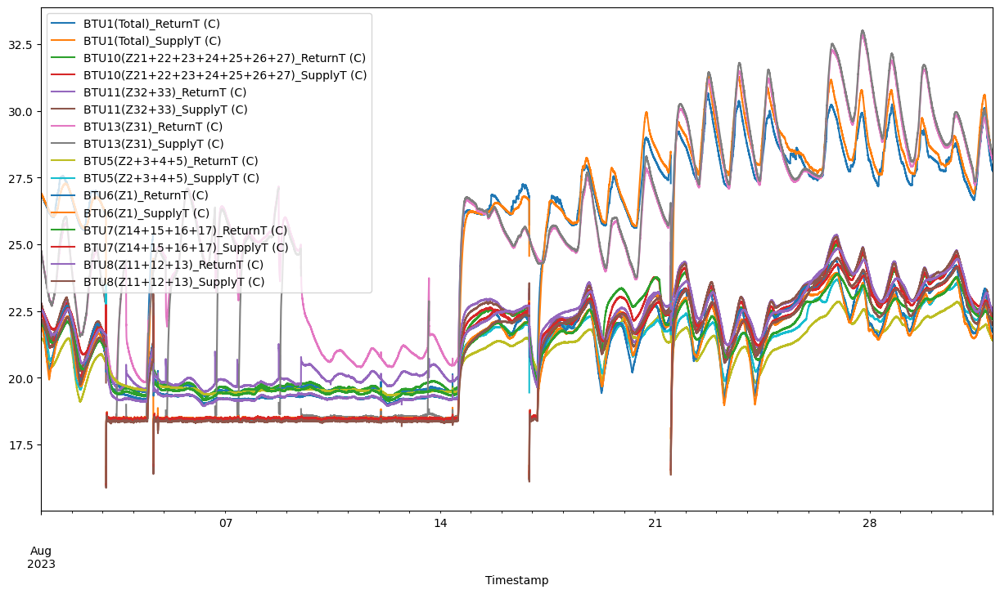

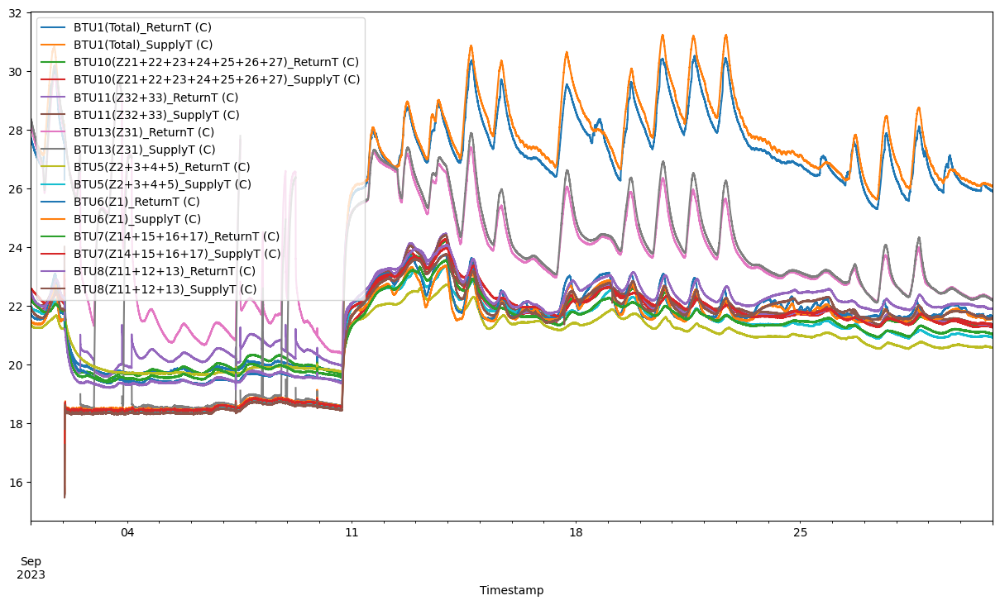

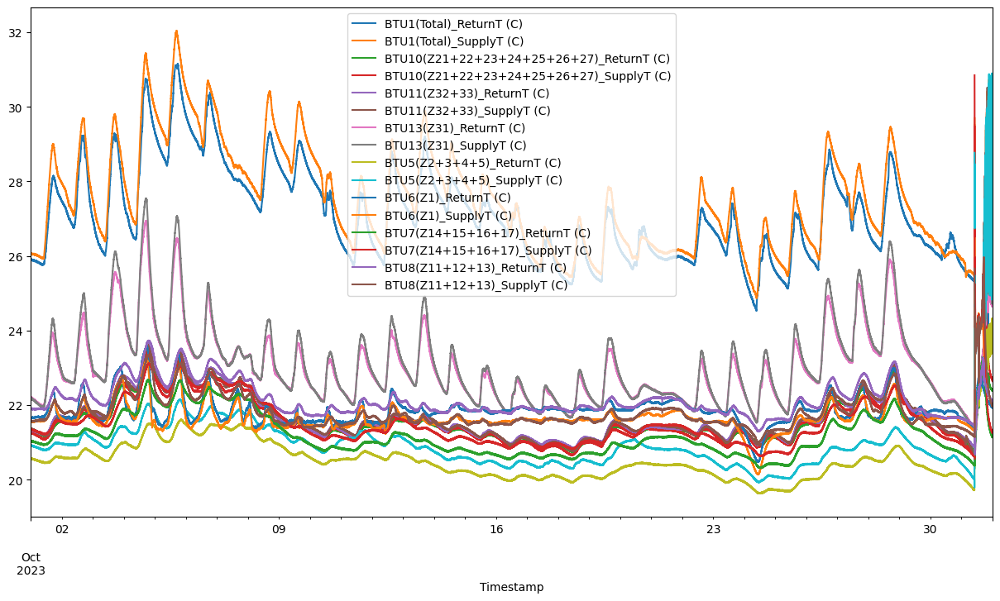

...

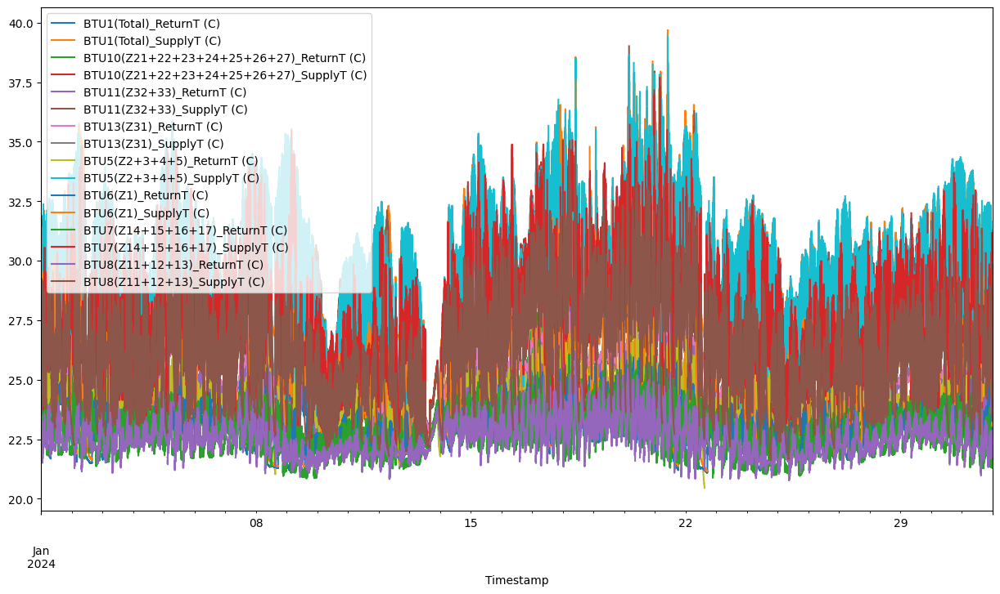

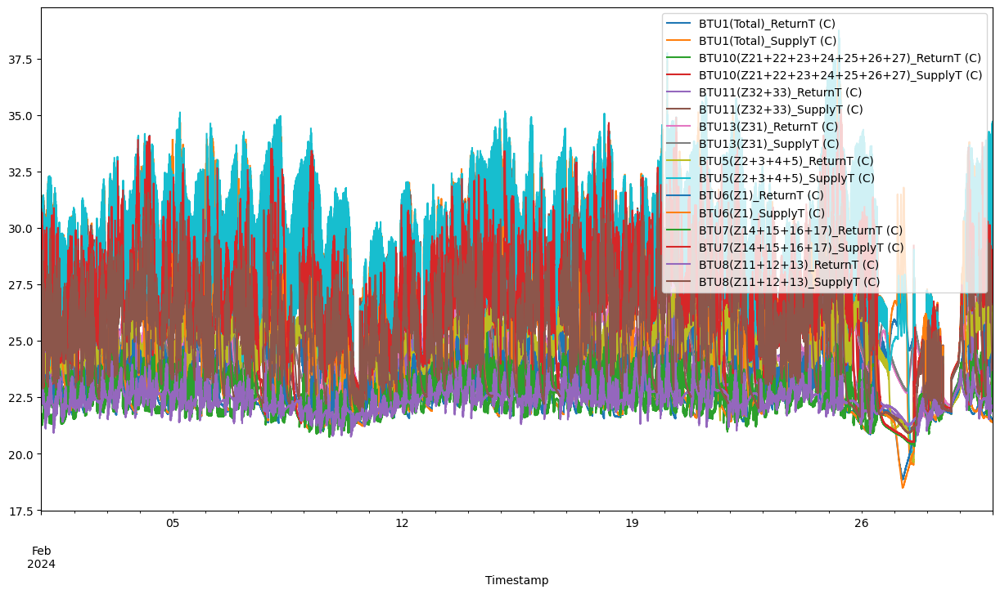

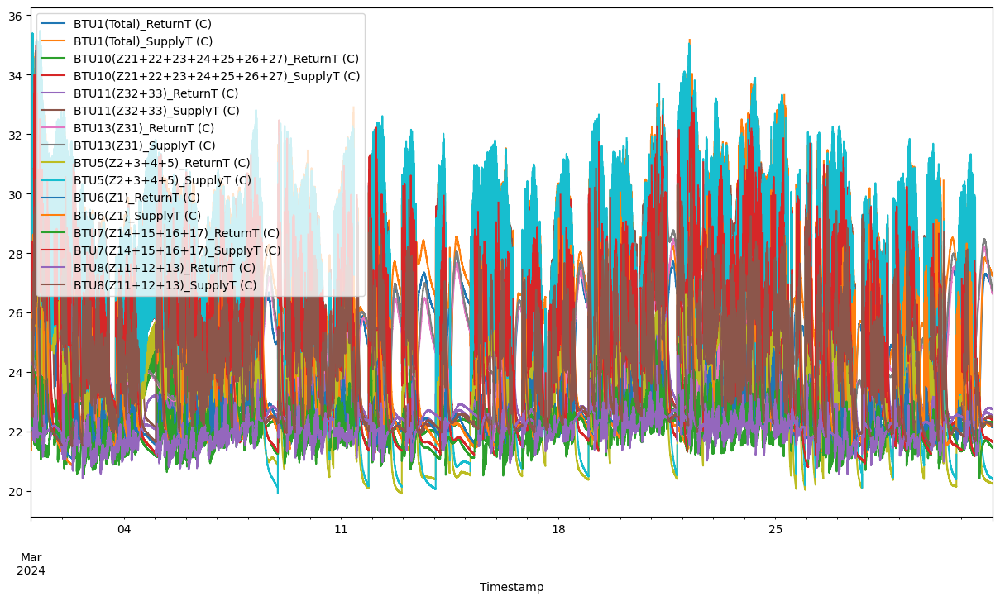

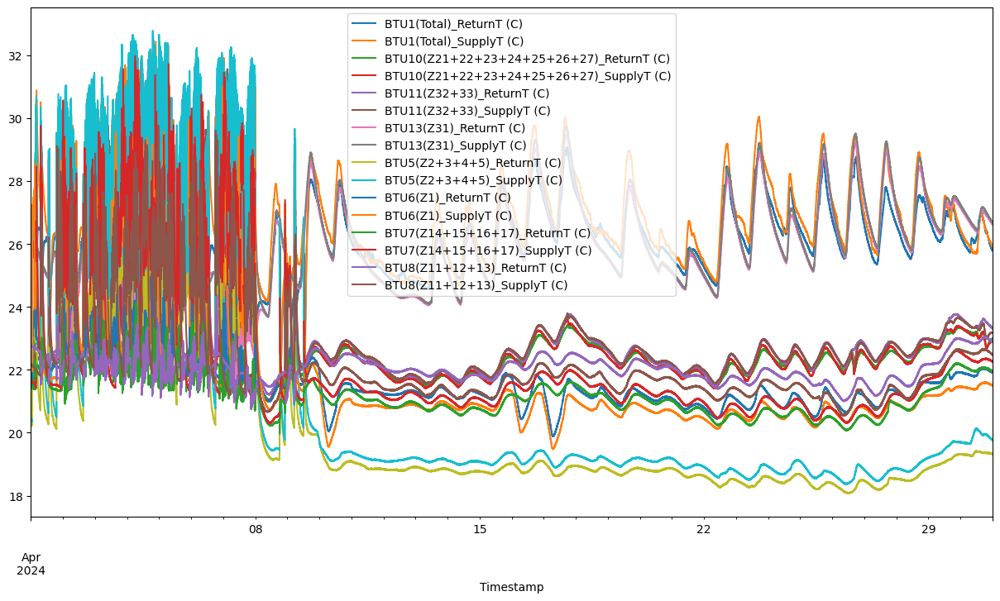

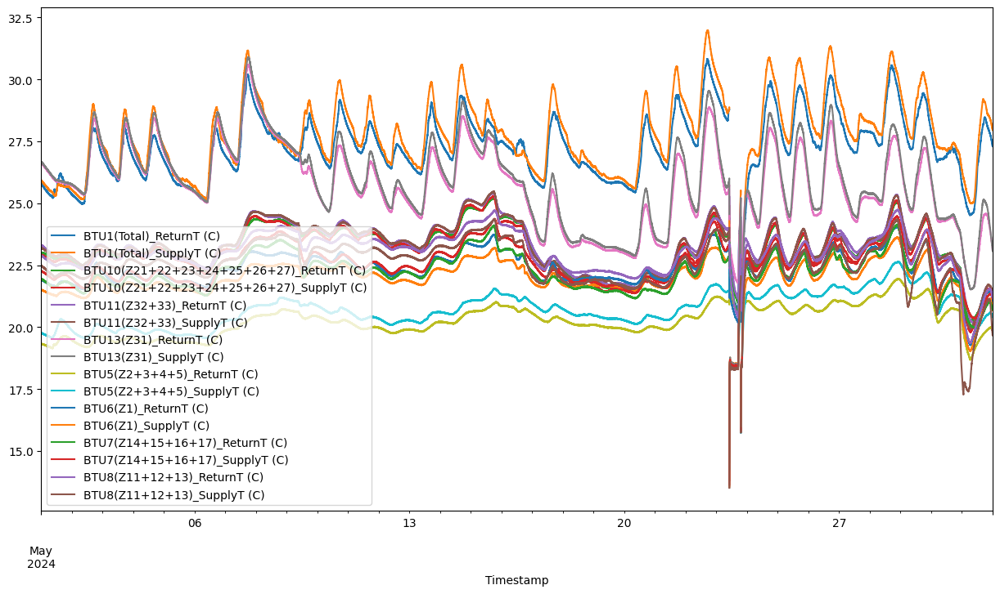

In [33]:
for (year, month), group in combined_df.groupby([combined_df.index.year, combined_df.index.month]):

    group.plot(figsize=(15, 8))

In [34]:
# Detecting rows with repeated values
repeated_index = (combined_df.diff() == 0).all(axis=1)
repeated_rows = combined_df[repeated_index]

# Now let's get the index of the repeated rows
repeated_rows_index = repeated_rows.index.tolist()
repeated_rows_index

[Timestamp('2023-06-02 13:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-02 15:51:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-03 14:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-03 15:52:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-06 13:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-06 14:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-07 03:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-08 03:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-08 15:55:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-11 15:56:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-11 23:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-12 15:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-13 15:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-14 13:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-14 15:03:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-14 15:57:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-15 03:19:00-0400', tz='US/Eastern'),
 Timestamp('2023-06-15 10:35:00

In [35]:
combined_df[repeated_index] = np.nan

In [36]:
df_total = pd.concat([combined_df, df_without_F], axis=1)

In [37]:
df_total

,BTU1(Total)_ReturnT (C),BTU1(Total)_SupplyT (C),BTU10(Z21+22+23+24+25+26+27)_ReturnT (C),BTU10(Z21+22+23+24+25+26+27)_SupplyT (C),BTU11(Z32+33)_ReturnT (C),BTU11(Z32+33)_SupplyT (C),BTU13(Z31)_ReturnT (C),BTU13(Z31)_SupplyT (C),BTU5(Z2+3+4+5)_ReturnT (C),BTU5(Z2+3+4+5)_SupplyT (C),...,BTU13(Z31)_energy (kBTU/h),BTU13(Z31)_flow (GPM),BTU5(Z2+3+4+5)_energy (kBTU/h),BTU5(Z2+3+4+5)_flow (GPM),BTU6(Z1)_energy (kBTU/h),BTU6(Z1)_flow (GPM),BTU7(Z14+15+16+17)_energy (kBTU/h),BTU7(Z14+15+16+17)_flow (GPM),BTU8(Z11+12+13)_energy (kBTU/h),BTU8(Z11+12+13)_flow (GPM)
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-06-01 00:00:00-04:00,26.958097,27.219001,22.814496,22.755322,22.932502,22.935859,24.221170,24.127901,20.717282,21.150708,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-06-01 00:01:00-04:00,26.962963,27.216504,22.807371,22.746086,22.926191,22.934011,24.223239,24.131970,20.706902,21.128667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-06-01 00:02:00-04:00,26.974237,27.222256,22.819044,22.747417,22.918578,22.927496,24.218517,24.132220,20.700747,21.129430,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-06-01 00:03:00-04:00,26.977047,27.217462,22.810838,22.752003,22.941331,22.939610,24.201893,24.117432,20.700823,21.128794,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-06-01 00:04:00-04:00,26.956512,27.206349,22.818854,22.745238,22.927619,22.936906,24.204915,24.110421,20.711661,21.135322,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-31 23:55:00-04:00,27.305171,27.952877,21.300006,21.129477,21.326934,21.356917,23.144925,23.128153,19.838638,20.411919,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-31 23:56:00-04:00,27.303157,27.951978,21.295183,21.131905,21.321229,21.348199,23.117960,23.099077,19.838604,20.416162,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-31 23:57:00-04:00,27.291573,27.945472,21.296433,21.130791,21.314786,21.343244,23.112835,23.095199,19.836358,20.400196,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


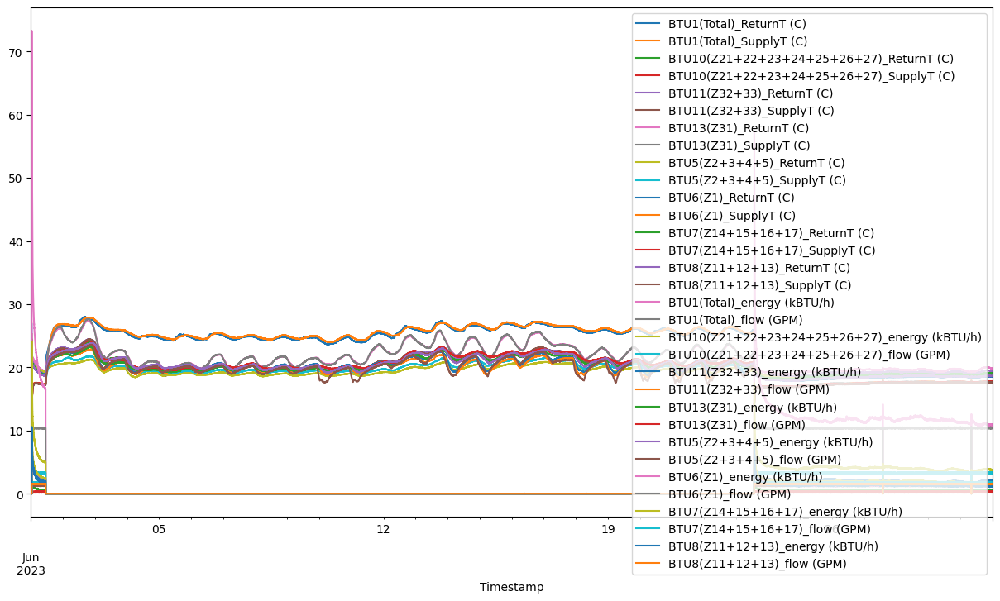

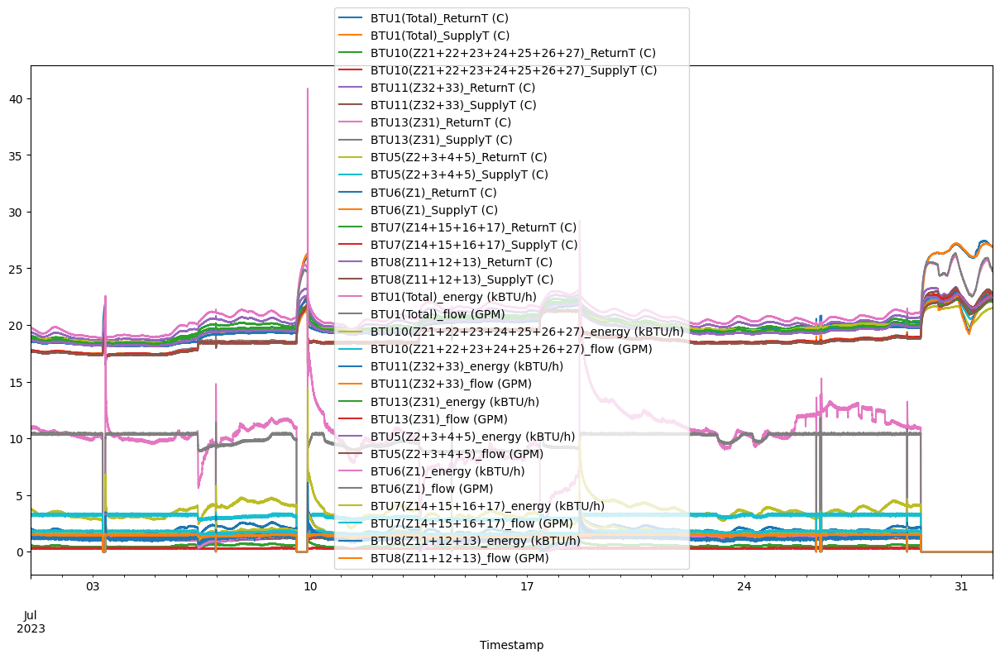

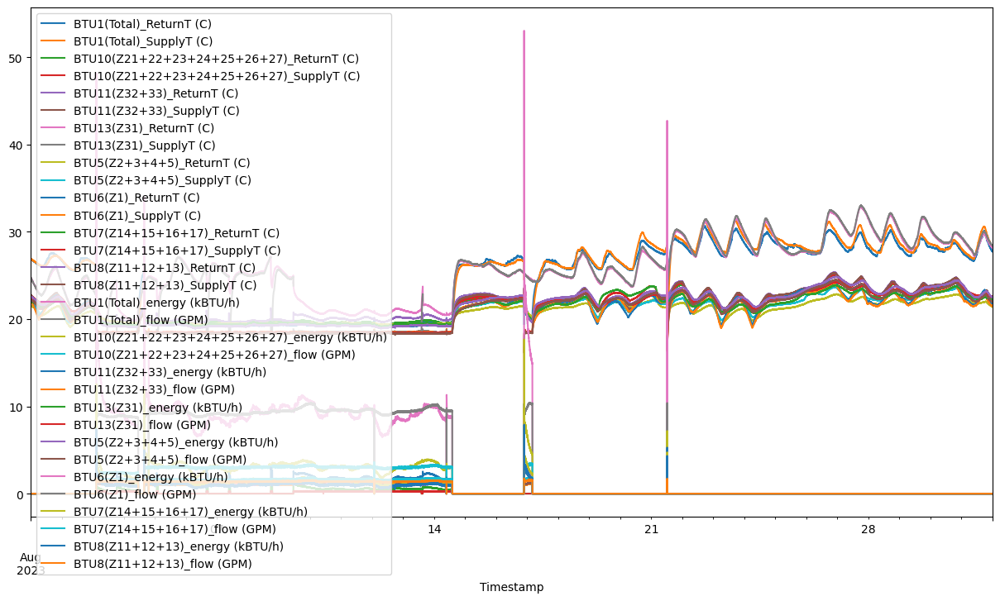

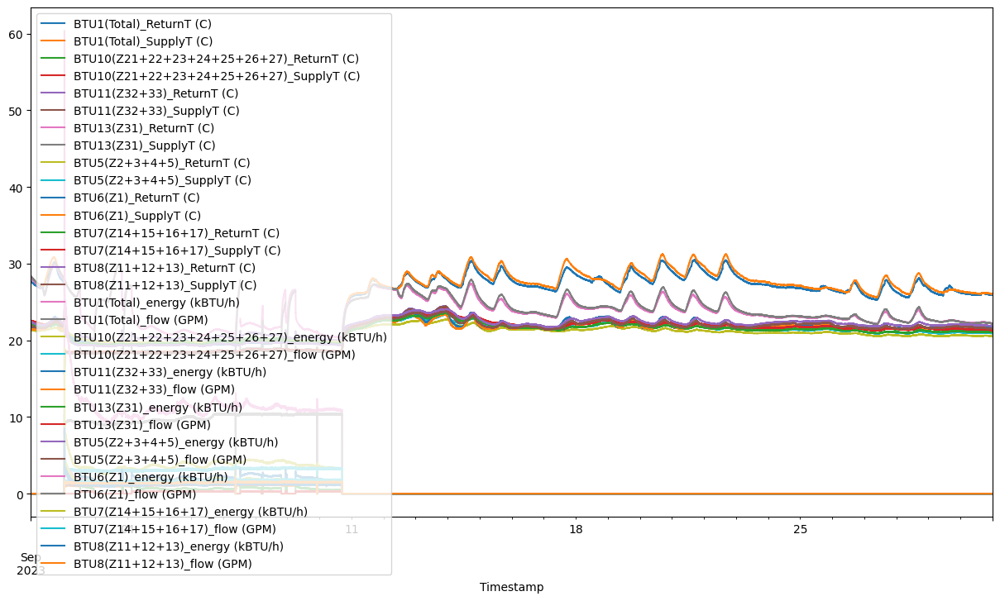

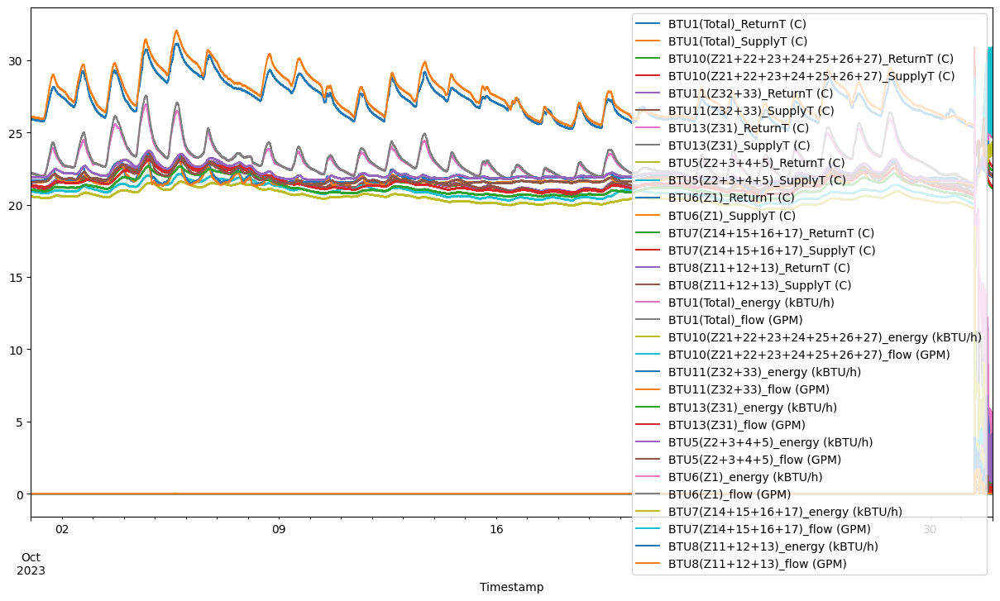

...

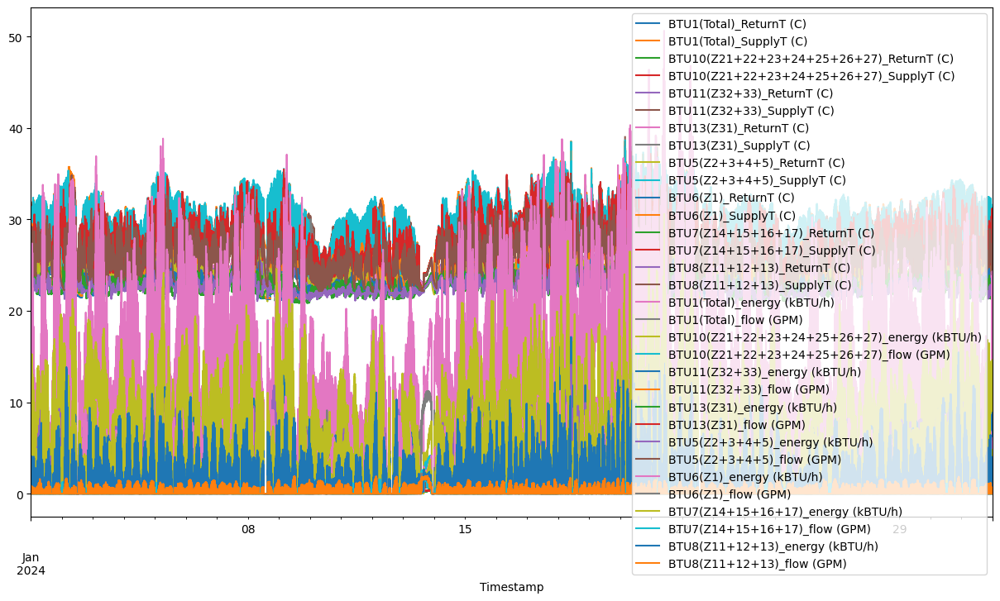

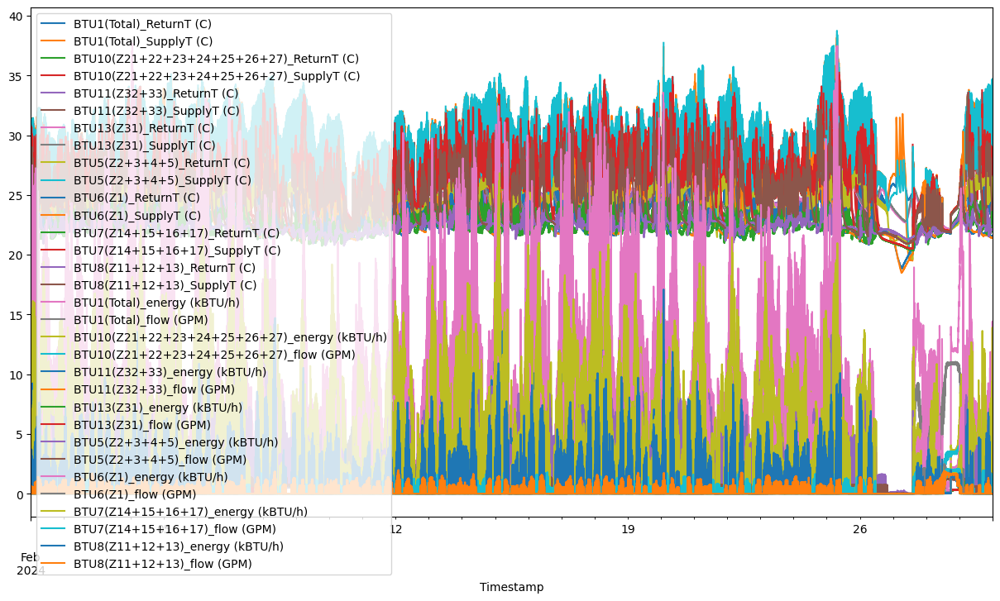

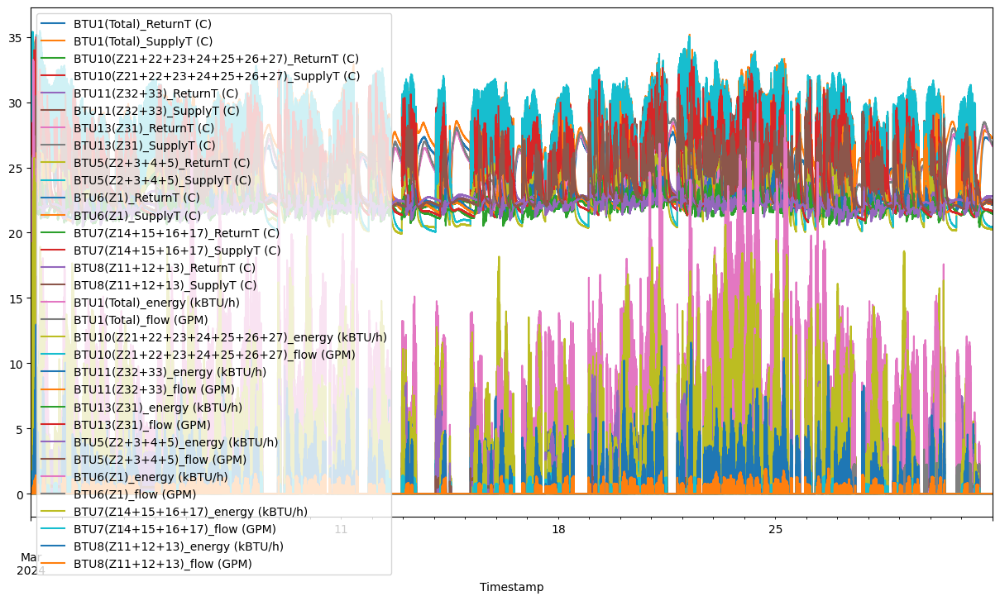

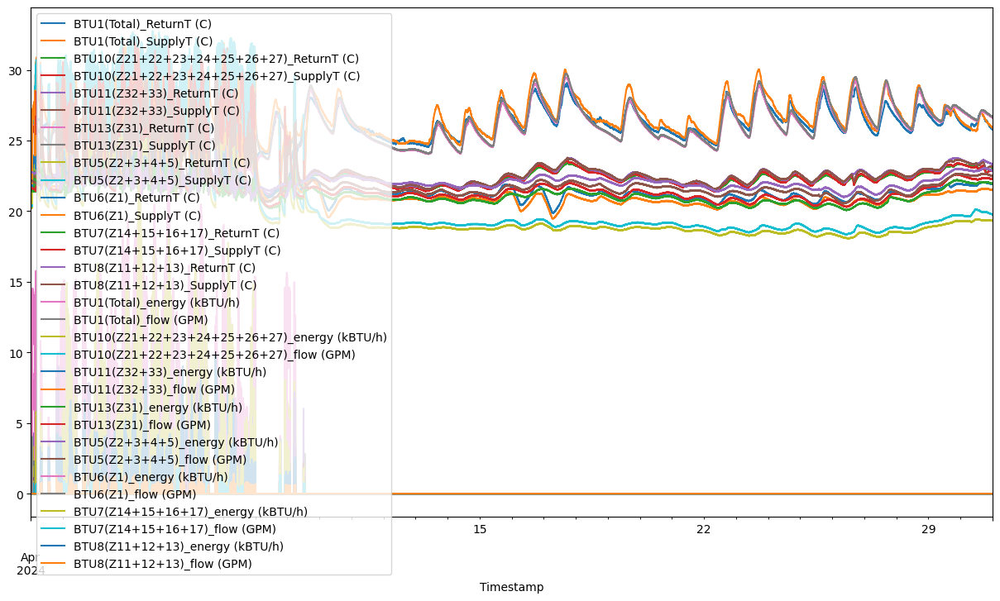

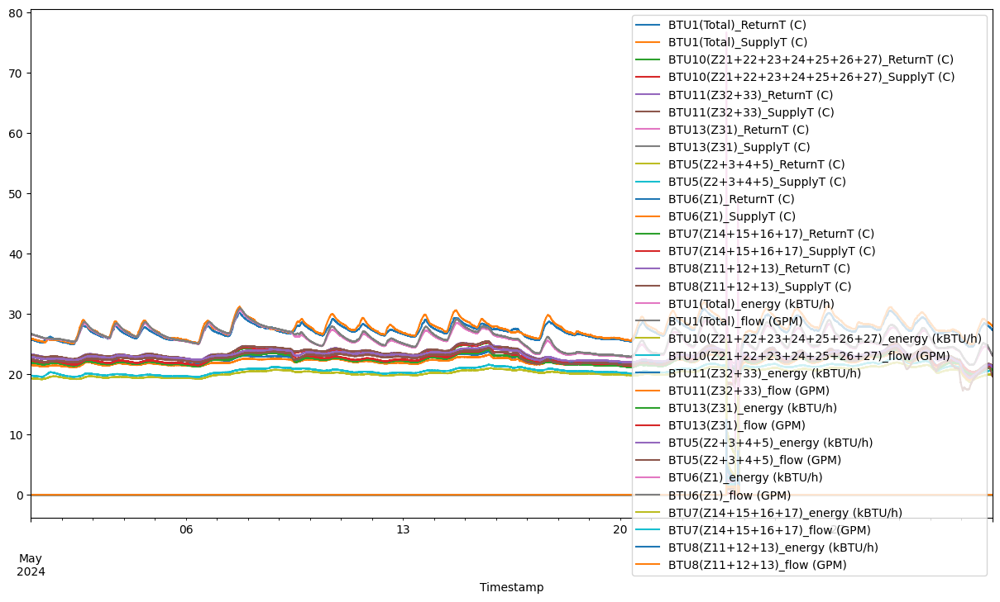

In [38]:
for (year, month), group in df_total.groupby([df_total.index.year, df_total.index.month]):

    group.plot(figsize=(15, 8))

C:\Users\Sang\AppData\Local\Temp\ipykernel_26824\3701859633.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_total = df_total.resample("H").mean().ffill()


<Axes: xlabel='Timestamp'>

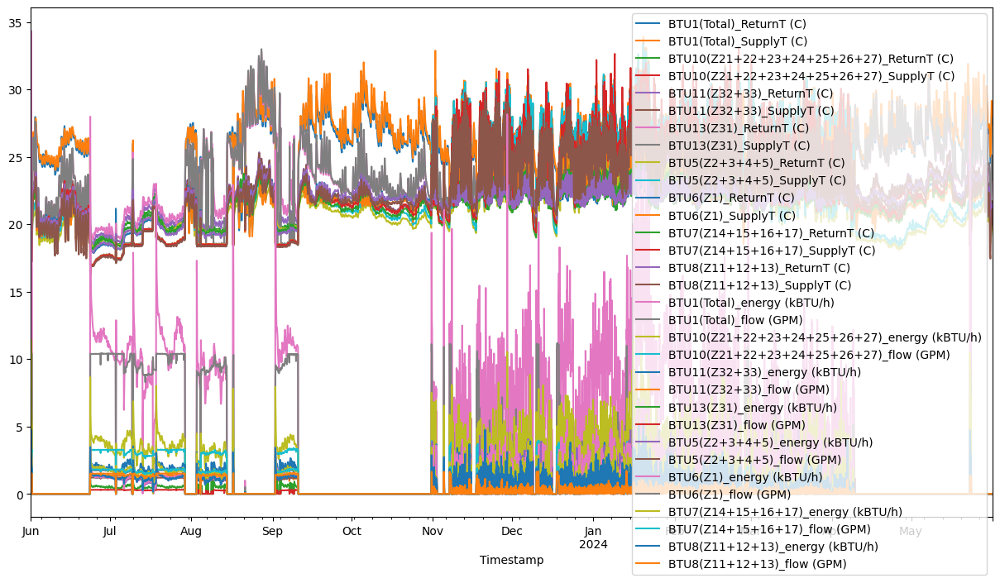

In [39]:
df_total = df_total.resample("H").mean().ffill()

df_total.plot(figsize=(15, 8))

In [40]:
#Missing data check code
def find_nan_sequences(series):
    is_nan = series.isna()
    if is_nan.any():
        start = end = None
        for i, val in enumerate(is_nan):
            if val and start is None:
                start = i
            elif not val and start is not None:
                end = i - 1
                yield (series.index[start], series.index[end])
                start = end = None
        if start is not None:
            yield (series.index[start], series.index[-1])

# Find and print start and end indices of NaN sequences in each column
empDF = pd.DataFrame()
LstN = []
LstS = []
LstE = []

for column in df_total.columns:
    for start, end in find_nan_sequences(df_total[column]):
        print(f"Missing period:'{column}' from {start} to {end}")
        LstN.append(column)
        LstS.append(start)
        LstE.append(end)
        
empDF["names"] = LstN
empDF["start"] = LstS
empDF["end"] = LstE

In [41]:
empDF.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Missing Intervals\Year4\Missing_periods_BTU_TABS_Year4.csv', index=False)

In [42]:
df_total.isna().sum()

BTU1(Total)_ReturnT (C)                         0
BTU1(Total)_SupplyT (C)                         0
BTU10(Z21+22+23+24+25+26+27)_ReturnT (C)        0
BTU10(Z21+22+23+24+25+26+27)_SupplyT (C)        0
BTU11(Z32+33)_ReturnT (C)                       0
BTU11(Z32+33)_SupplyT (C)                       0
BTU13(Z31)_ReturnT (C)                          0
BTU13(Z31)_SupplyT (C)                          0
BTU5(Z2+3+4+5)_ReturnT (C)                      0
BTU5(Z2+3+4+5)_SupplyT (C)                      0
BTU6(Z1)_ReturnT (C)                            0
BTU6(Z1)_SupplyT (C)                            0
BTU7(Z14+15+16+17)_ReturnT (C)                  0
BTU7(Z14+15+16+17)_SupplyT (C)                  0
BTU8(Z11+12+13)_ReturnT (C)                     0
BTU8(Z11+12+13)_SupplyT (C)                     0
BTU1(Total)_energy (kBTU/h)                     0
BTU1(Total)_flow (GPM)                          0
BTU10(Z21+22+23+24+25+26+27)_energy (kBTU/h)    0
BTU10(Z21+22+23+24+25+26+27)_flow (GPM)         0


In [44]:
df_total.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Desigo\Year4\Zone_BTU_TABS_Year4.csv', index=True)